<a href="https://colab.research.google.com/github/Nurslatip/Bishkek-Real-Estate-Price-Prediction/blob/notebooks/catboost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.4/247.4 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 607.6/607.6 kB 30.9 MB/s eta 0:00:00


In [2]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 3.8 MB/s eta 0:00:00


In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
import re
warnings.simplefilter("ignore")

sns.set(style="darkgrid")
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(handle_unknown="ignore")
from sklearn.ensemble import RandomForestRegressor
import optuna
from optuna.samplers import TPESampler
from optuna.pruners import MedianPruner
from catboost import CatBoostRegressor, Pool

In [4]:
from google.colab import files
files.upload()

Saving test.csv to test.csv
Saving train.csv to train.csv


{'test.csv': b'id,main,address,added,upped,view_count,hearts,lat,lon,\xd0\xa2\xd0\xb8\xd0\xbf \xd0\xbf\xd1\x80\xd0\xb5\xd0\xb4\xd0\xbb\xd0\xbe\xd0\xb6\xd0\xb5\xd0\xbd\xd0\xb8\xd1\x8f,\xd0\xa1\xd0\xb5\xd1\x80\xd0\xb8\xd1\x8f,\xd0\x94\xd0\xbe\xd0\xbc,\xd0\xad\xd1\x82\xd0\xb0\xd0\xb6,\xd0\x9f\xd0\xbb\xd0\xbe\xd1\x89\xd0\xb0\xd0\xb4\xd1\x8c,\xd0\x9e\xd1\x82\xd0\xbe\xd0\xbf\xd0\xbb\xd0\xb5\xd0\xbd\xd0\xb8\xd0\xb5,\xd0\xa1\xd0\xbe\xd1\x81\xd1\x82\xd0\xbe\xd1\x8f\xd0\xbd\xd0\xb8\xd0\xb5,\xd0\x93\xd0\xb0\xd0\xb7,\xd0\xa1\xd0\xb0\xd0\xbd\xd1\x83\xd0\xb7\xd0\xb5\xd0\xbb,\xd0\x91\xd0\xb0\xd0\xbb\xd0\xba\xd0\xbe\xd0\xbd,\xd0\x92\xd1\x85\xd0\xbe\xd0\xb4\xd0\xbd\xd0\xb0\xd1\x8f \xd0\xb4\xd0\xb2\xd0\xb5\xd1\x80\xd1\x8c,\xd0\x9f\xd0\xb0\xd1\x80\xd0\xba\xd0\xbe\xd0\xb2\xd0\xba\xd0\xb0,\xd0\x92\xd1\x8b\xd1\x81\xd0\xbe\xd1\x82\xd0\xb0 \xd0\xbf\xd0\xbe\xd1\x82\xd0\xbe\xd0\xbb\xd0\xba\xd0\xbe\xd0\xb2,\xd0\x91\xd0\xb5\xd0\xb7\xd0\xbe\xd0\xbf\xd0\xb0\xd1\x81\xd0\xbd\xd0\xbe\xd1\x81\xd1\x82\xd1\x8c,\xd0\x9f\x

In [5]:
train_file_path ="/content/train.csv"
train = pd.read_csv(train_file_path)
test_file_path = "/content/test.csv"
test = pd.read_csv(test_file_path)

In [6]:
features_to_drop = [
    'Питьевая вода',
    'Электричество',
    'Канализация',
    'Площадь участка',
    'Возможность рассрочки',
    'Возможность обмена',
    'Пол',
    'Телефон',
    'Интернет',
    'Возможность ипотеки',
    'Парковка',
    'Безопасность',
    'Мебель',
    'Балкон',
    'Разное',
    'Газ',
    'Входная дверь',
    'Санузел',
    'Правоустанавливающие документы',
    'Высота потолков'
]


In [7]:
train = train.drop(columns = features_to_drop)
test = test.drop(columns = features_to_drop)

In [8]:
import re
import pandas as pd
from typing import Optional

def get_rooms(description: str) -> Optional[int]:
    """
    Extracts room count from Russian real estate descriptions including special cases.
    Handles:
    - Standard formats: '3-комн. кв.', '2 комн. квартира'
    - Studios: 'студия', 'квартира-студия'
    - Luxury: 'пентхаус 3 комнаты', 'индивидуальная планировка'
    - Special cases: '6 и более комнат', 'свободная планировка'
    - Abbreviated: '1-к. квартира', '4 комнатная'

    Returns:
        int: Room count (6 for '6 и более', 0 for free layouts)
        None: If no room count could be determined
    """
    if pd.isna(description):
        return None

    description = str(description).lower().strip()

    # Handle special cases first
    if "6 и более комнат" in description:
        return 6  # Or consider using a higher number like 7 if you want to differentiate

    if "свободная планировка" in description:
        return 0  # Using 0 as special code for free layouts

    # Original logic for other cases
    studio_keywords = ['студи', 'studio']
    if any(kw in description for kw in studio_keywords):
        return 1

    luxury_keywords = ['пентхаус', 'индивидуальн']
    if any(kw in description for kw in luxury_keywords):
        match = re.search(r'(\d+)\s?(?:комнат|к\.?)', description)
        return int(match.group(1)) if match else 1

    patterns = [
        r'^(\d+)-комн\.?',
        r'^(\d+)\s?комн\.?',
        r'(\d+)-к\.?\s',
        r'(\d+)\s?комнатная',
        r'квартира\s(\d+)\s?к'
    ]

    for pattern in patterns:
        match = re.search(pattern, description)
        if match:
            try:
                return int(match.group(1))
            except (ValueError, IndexError):
                continue

    return None

In [9]:
train.insert(0, 'num_room', train['main'].map(get_rooms))
test.insert(0, 'num_room', test['main'].map(get_rooms))

In [10]:
def get_area(area_str: str) -> float:
    """
    Extracts the total area (first number before м2) from area descriptions.
    Handles formats like:
    - "113.8 м2, жилая: 62.9 м2" → 113.8
    - "66 м2" → 66.0
    - "48 м2, жилая: 30 м2, кухня: 10 м2" → 48.0
    """
    if pd.isna(area_str):
        return None

    match = re.search(r'(\d+\.?\d*)\s*м2', str(area_str))
    return float(match.group(1)) if match else None

In [11]:
test.insert(1, 'area', test['Площадь'].map(get_area))
train.insert(1, 'area', train['Площадь'].map(get_area))

In [12]:
def perform_feature_engineering(df: pd.DataFrame) -> pd.DataFrame:

    processed_df = df.copy() # Work on a copy to avoid modifying the original 'train' DataFrame directly

    # --- Preprocessing 'added' and 'upped' (Time Features) ---
    def parse_time_string(added_str, upped_str):
        added_str = str(added_str).lower()
        upped_str = str(upped_str).lower()
        days_added = np.nan
        hours_lifted = np.nan

        added_match_months = re.search(r'добавлено (\d+)\s*мес', added_str)
        added_match_days = re.search(r'добавлено (\d+)\s*дн', added_str)

        if added_match_months:
            days_added = int(added_match_months.group(1)) * 30 # Approximate months to days
        elif added_match_days:
            days_added = int(added_match_days.group(1))

        lifted_match_hours = re.search(r'поднято (\d+)\s*час', upped_str)
        lifted_match_days = re.search(r'поднято (\d+)\s*дн', upped_str)

        if lifted_match_hours:
            hours_lifted = int(lifted_match_hours.group(1))
        elif lifted_match_days:
            hours_lifted = int(lifted_match_days.group(1)) * 24 # Convert days to hours


        return days_added, hours_lifted

    # Apply the function to the 'added' and 'upped' columns
    processed_df[['days_since_added', 'hours_since_lifted']] = processed_df.apply(lambda row: parse_time_string(row['added'], row['upped']), axis=1, result_type='expand')


    # --- Preprocessing 'Дом' (Material and Year) ---
    def parse_dom(s):
        s = str(s).lower()
        material = 'unknown' # Default for unparsed or missing
        year = np.nan

        if 'кирпичный' in s: material = 'кирпичный'
        elif 'монолитный' in s: material = 'monolit' # Ensure consistent casing if needed
        elif 'панельный' in s: material = 'panel' # Example
        # Add more materials as needed based on your data:
        # elif 'деревянный' in s: material = 'wooden' etc.

        year_match = re.search(r'(\d{4})\s*г\.', s) # e.g., "2017 г."
        if year_match:
            year = int(year_match.group(1))

        return material, year

    processed_df[['Материал_дома', 'Год_постройки']] = processed_df['Дом'].apply(lambda x: pd.Series(parse_dom(x)))

    # --- Preprocessing 'Этаж' (Current and Total Floors) ---
    def parse_floor_info(s):
        s = str(s).lower()
        current_floor = np.nan
        total_floors = np.nan

        match = re.search(r'(\d+)\s*этаж из\s*(\d+)', s)
        if match:
            current_floor = int(match.group(1))
            total_floors = int(match.group(2))

        return current_floor, total_floors

    processed_df[['Текущий_этаж', 'Всего_этажей']] = processed_df['Этаж'].apply(lambda x: pd.Series(parse_floor_info(x)))

    processed_df['Относительный_этаж'] = processed_df['Текущий_этаж'] / processed_df['Всего_этажей']
    processed_df['Относительный_этаж'] = processed_df['Относительный_этаж'].replace([np.inf, -np.inf], np.nan)

    # --- Drop original complex columns ---
    # 'address' is kept as it's a direct categorical feature
    processed_df = processed_df.drop(columns=['added', 'upped', 'Дом', 'Этаж'])

    # --- Impute NaNs created during parsing for newly engineered numerical features ---
    for col in ['days_since_added', 'hours_since_lifted', 'Год_постройки',
                'Текущий_этаж', 'Всего_этажей', 'Относительный_этаж']:
        if processed_df[col].isnull().any():
            processed_df[col] = pd.to_numeric(processed_df[col], errors='coerce') # Ensure numeric before median
            processed_df[col] = processed_df[col].fillna(processed_df[col].median())

    # For the newly created categorical 'Материал_дома', ensure no NaNs.
    if processed_df['Материал_дома'].isnull().any():
         processed_df['Материал_дома'] = processed_df['Материал_дома'].fillna('unknown')

    # Ensure 'num_room' is numeric. (df.info shows int64, but this is a safeguard)
    processed_df['num_room'] = pd.to_numeric(processed_df['num_room'], errors='coerce').fillna(processed_df['num_room'].median())

    return processed_df


train = perform_feature_engineering(train)
test = perform_feature_engineering(test)



In [13]:
train =  train.drop(columns = ['Площадь', 'main'])
test  = test.drop(columns = ['Площадь', 'main'])

Text(0, 0.5, 'FEATURES')

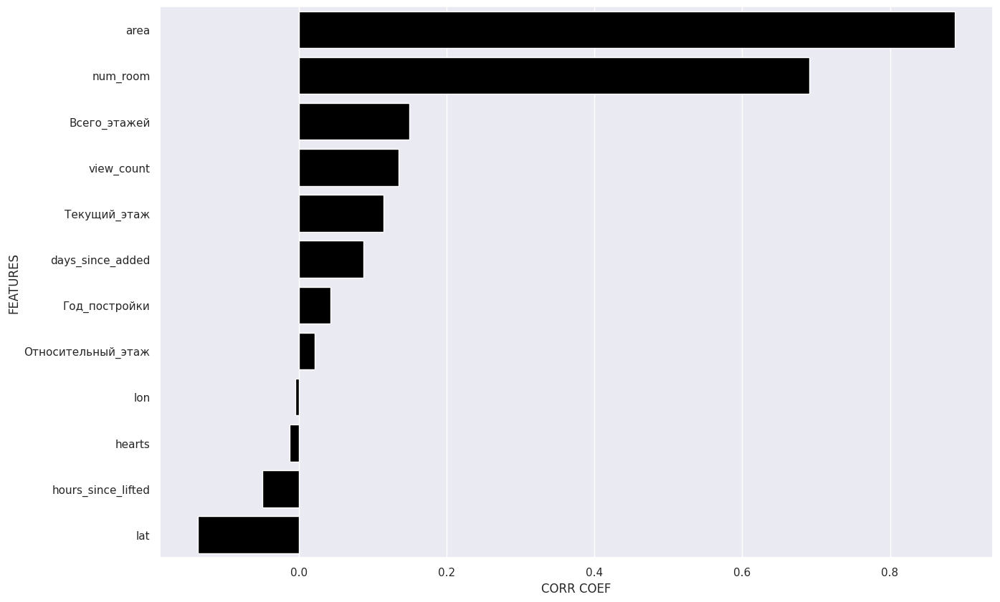

In [14]:
y = train.usd_price
train.drop('usd_price', axis=1, inplace=True)
numeric_data = train.select_dtypes([np.number])
numeric_data_mean = numeric_data.mean() # получим средние для всех признаков
numeric_features = numeric_data.columns

train.fillna(numeric_data_mean, inplace=True) # Заполним пропуски средними (Хорошо ли это делать так?)
test.fillna(numeric_data_mean, inplace = True)

correlations = train[numeric_features].corrwith(y).sort_values(ascending=False)


plot = sns.barplot(y=correlations.index, x=correlations, color='black')
plot.figure.set_size_inches(15, 10)
plt.xlabel('CORR COEF')
plt.ylabel('FEATURES')

In [15]:
categorical = train.dtypes[train.dtypes == "object"].index.tolist()
train[categorical] = train[categorical].fillna("NotGiven")
test[categorical] = test[categorical].fillna('NotGiven')

In [16]:
X = train

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

In [18]:
def objective_catboost_mape(trial):
    # CatBoost Hyperparameters
    iterations = trial.suggest_int("catboost_regressor__iterations", 100, 1000)
    learning_rate = trial.suggest_float("catboost_regressor__learning_rate", 1e-3, 0.1, log=True)
    depth = trial.suggest_int("catboost_regressor__depth", 4, 10)
    l2_leaf_reg = trial.suggest_float("catboost_regressor__l2_leaf_reg", 1e-2, 10.0, log=True)
    random_strength = trial.suggest_float("catboost_regressor__random_strength", 0.1, 10.0, log=True)
    bagging_temperature = trial.suggest_float("catboost_regressor__bagging_temperature", 0.0, 1.0)

    # The ColumnTransformer is necessary to maintain feature order and types for the pipeline.
    # We explicitly define the passthrough for both numerical and categorical features.
    column_transformer = ColumnTransformer(
        [
            ('numeric', 'passthrough', numeric_features),
            ('categorical', 'passthrough', categorical)
        ],
        remainder='drop'
    )

    pipeline = Pipeline([
        ('preprocessing', column_transformer),  # Keep the ColumnTransformer
        ('catboost_regressor', CatBoostRegressor(
            random_seed=42,
            verbose=0,
            loss_function='RMSE',
            iterations=iterations,
            learning_rate=learning_rate,
            depth=depth,
            l2_leaf_reg=l2_leaf_reg,
            random_strength=random_strength,
            bagging_temperature=bagging_temperature,
            # Pass the indices of the categorical features here.
            # The indices are calculated from the length of the numeric_features list.
            cat_features=list(range(len(numeric_features), len(numeric_features) + len(categorical)))
        ))
    ])

    y_pred_cv = cross_val_predict(pipeline, X_train, y_train, cv=5, n_jobs=-1)
    mape = mean_absolute_percentage_error(y_train, y_pred_cv)
    return mape

# --- Optuna Study Setup and Run (Optimizing for MAPE with CatBoost) ---
study_catboost_mape = optuna.create_study(
    storage="sqlite:///catboost_optuna_mape_study.db",
    study_name="catboost_mape_tuning",
    direction="minimize",
    load_if_exists=True,
    sampler=TPESampler(seed=42,),
    pruner=MedianPruner(n_startup_trials=5, n_warmup_steps=10)
)
print("Starting Optuna optimization for CatBoostRegressor, focusing on MINIMIZING MAPE...")
study_catboost_mape.optimize(objective_catboost_mape, n_trials=100, timeout=120)

# --- 4. Get Best Results ---
print("\n--- Optuna Results for CatBoostRegressor (MAPE Optimization) ---")
print(f"Number of finished trials: {len(study_catboost_mape.trials)}")
print(f"Best trial:")
print(f"  Value (MAPE): {study_catboost_mape.best_value:.4f}")
print("  Params: ")
for key, value in study_catboost_mape.best_params.items():
    print(f"    {key}: {value}")

# --- 5. Train Final Model with Best Parameters ---
best_params_catboost_mape = study_catboost_mape.best_params
catboost_params_mape = {k.replace('catboost_regressor__', ''): v for k, v in best_params_catboost_mape.items()}
catboost_params_mape['random_seed'] = 42
catboost_params_mape['verbose'] = 100
catboost_params_mape['loss_function'] = 'RMSE'

# Re-create the ColumnTransformer
final_column_transformer_catboost = ColumnTransformer(
    [
        ('numeric', 'passthrough', numeric_features),
        ('categorical', 'passthrough', categorical)
    ],
    remainder='drop'
)

# Re-create the final pipeline
final_pipeline_catboost_mape = Pipeline([
    ('preprocessing', final_column_transformer_catboost),
    ('catboost_regressor', CatBoostRegressor(
        **catboost_params_mape,
        cat_features=list(range(len(numeric_features), len(numeric_features) + len(categorical)))
    ))
])

print("\nFitting final CatBoostRegressor pipeline (MAPE optimized) on the entire training dataset...")
final_pipeline_catboost_mape.fit(X_train, y_train)

# --- Evaluate with cross-validation on Training Set ---
y_pred_train_final_catboost_mape = cross_val_predict(final_pipeline_catboost_mape, X_train, y_train, cv=5, n_jobs=-1)

print("\n--- Final CatBoostRegressor CV Metrics (MAPE Optimized) ---")
print("CV R2:\t\t %.4f" % r2_score(y_train, y_pred_train_final_catboost_mape))
print("CV MAE:\t\t %.4f" % mean_absolute_error(y_train, y_pred_train_final_catboost_mape))
print("CV MAPE:\t %.4f" % mean_absolute_percentage_error(y_train, y_pred_train_final_catboost_mape))
print("CV MSE:\t\t %.4f" % mean_squared_error(y_train, y_pred_train_final_catboost_mape))

# --- Evaluate on the Test Set ---
y_pred_test_final_catboost_mape = final_pipeline_catboost_mape.predict(X_test)
print("\n--- Final CatBoostRegressor Test Set Metrics (MAPE Optimized) ---")
print("Test R2:\t\t %.4f" % r2_score(y_test, y_pred_test_final_catboost_mape))
print("Test MAE:\t\t %.4f" % mean_absolute_error(y_test, y_pred_test_final_catboost_mape))
print("Test MAPE:\t\t %.4f" % mean_absolute_percentage_error(y_test, y_pred_test_final_catboost_mape))
print("Test MSE:\t\t %.4f" % mean_squared_error(y_test, y_pred_test_final_catboost_mape))

[I 2025-09-10 14:06:16,317] A new study created in RDB with name: catboost_mape_tuning


Starting Optuna optimization for CatBoostRegressor, focusing on MINIMIZING MAPE...


[I 2025-09-10 14:06:41,812] Trial 0 finished with value: 0.09873641273044069 and parameters: {'catboost_regressor__iterations': 437, 'catboost_regressor__learning_rate': 0.07969454818643935, 'catboost_regressor__depth': 9, 'catboost_regressor__l2_leaf_reg': 0.6251373574521749, 'catboost_regressor__random_strength': 0.20513382630874505, 'catboost_regressor__bagging_temperature': 0.15599452033620265}. Best is trial 0 with value: 0.09873641273044069.
[I 2025-09-10 14:06:45,064] Trial 1 finished with value: 0.1108831047236633 and parameters: {'catboost_regressor__iterations': 152, 'catboost_regressor__learning_rate': 0.05399484409787434, 'catboost_regressor__depth': 8, 'catboost_regressor__l2_leaf_reg': 1.3311216080736887, 'catboost_regressor__random_strength': 0.10994335574766201, 'catboost_regressor__bagging_temperature': 0.9699098521619943}. Best is trial 0 with value: 0.09873641273044069.
[I 2025-09-10 14:06:59,552] Trial 2 finished with value: 0.17487899059499412 and parameters: {'cat


--- Optuna Results for CatBoostRegressor (MAPE Optimization) ---
Number of finished trials: 10
Best trial:
  Value (MAPE): 0.0987
  Params: 
    catboost_regressor__iterations: 437
    catboost_regressor__learning_rate: 0.07969454818643935
    catboost_regressor__depth: 9
    catboost_regressor__l2_leaf_reg: 0.6251373574521749
    catboost_regressor__random_strength: 0.20513382630874505
    catboost_regressor__bagging_temperature: 0.15599452033620265

Fitting final CatBoostRegressor pipeline (MAPE optimized) on the entire training dataset...
0:	learn: 72877.3264831	total: 57.6ms	remaining: 25.1s
100:	learn: 15997.5225524	total: 1.1s	remaining: 3.66s
200:	learn: 11290.7889246	total: 2.2s	remaining: 2.58s
300:	learn: 8551.8379233	total: 3.3s	remaining: 1.49s
400:	learn: 6847.1552039	total: 4.4s	remaining: 395ms
436:	learn: 6370.8826139	total: 4.81s	remaining: 0us

--- Final CatBoostRegressor CV Metrics (MAPE Optimized) ---
CV R2:		 0.8897
CV MAE:		 12447.4154
CV MAPE:	 0.0987
CV MSE:		 

In [19]:
train.head(5)

,num_room,area,address,view_count,hearts,lat,lon,Тип предложения,Серия,Отопление,Состояние,days_since_added,hours_since_lifted,Материал_дома,Год_постройки,Текущий_этаж,Всего_этажей,Относительный_этаж
0,3,113.8,"Бишкек, Московская - Уметалиева, Московская, 191",302,1.000000,42.8711,74.5823,от агента,индивид. планировка,NotGiven,NotGiven,60.0,12.0,кирпичный,2017.0,10.0,12.0,0.833333
1,2,66.0,"Бишкек, с. Кок-Джар, с.Кок-Жар, ул.Конкур Осмо...",102,3.967271,42.8131,74.6482,от агента,элитка,на газе,евроремонт,7.0,7.0,monolit,2023.0,10.0,12.0,0.833333
2,3,68.0,"Бишкек, 12 м-н, 12-й микрорайон, 69",104,3.967271,42.8129,74.6390,от агента,106 серия,NotGiven,NotGiven,5.0,9.0,кирпичный,1990.0,7.0,9.0,0.777778
3,4,135.0,"Бишкек, Магистраль, Байтик Баатыра (недалеко о...",797,3.000000,42.8171,74.6059,от агента,элитка,на газе,евроремонт,120.0,7.0,monolit,2022.0,6.0,14.0,0.428571
4,2,67.0,"Бишкек, Джал 15 м-н, Ахунбаева/Тыналиева",512,1.000000,42.8467,74.5656,от агента,элитка,на газе,евроремонт,90.0,480.0,monolit,2023.0,6.0,14.0,0.428571


In [ ]:
mycatboost = final_pipeline_catboost_mape.predict(test)


In [ ]:
mycatboost_subm = pd.DataFrame({
    'id': test['id'],
    'predicted_price': mycatboost
})

In [ ]:
mycatboost_subm.to_csv('mycatres.csv', index=False)